# Juxtapose Two Corpus (Similarity and Polarity)

**Appropriate datasets:**
1. Tweets

**Required metadata:**
1. datetime

**Methods (Using political tweets dataset):**
1. slice the corpus into quintile 0 and quintile 4 (Left-wing, Right-wing)
2. slice the quintile 0 and quintile 4 each into monthly corpus.

**This notebook answers the following which requires more and more granular analysis:**

*1. When is there peak activity?*

Plot monthly corpus size to reveal peaks

*2. How similar are these corpus?*

Corpus similarity using cosine similarity on different metrics. (todo: this can actually be a heatmap)

*3. During the month of peak activity, what are the left saying compared to the right?*

Wordcloud that shows the more representative words and coloured based on their dominance.

In [1]:
import os
if  not 'juxtorpus' in os.listdir():
    os.chdir('../../')
assert 'juxtorpus' in os.listdir(), f"Working directory should be at juxtorpus. But at {os.getcwd()}"
f"Working directory: {os.getcwd()}"

'Working directory: /Users/hcha9747/workspace/juxtorpus'

In [2]:
from juxtorpus.viz.widgets import FileUploadWidget

# please upload in .zip format of the directories
fwidget = FileUploadWidget()
fwidget.widget()

In [3]:
f"You have uploaded {len(fwidget.uploaded())} files."

'You have uploaded 2 files.'

In [4]:
# Tristram project specific: transform text files into csv.
# from scripts.tristram.quintiles_to_csv import transform
# dirs = set(f.parent for f in fwidget.uploaded())
# csv_paths = [transform(d) for d in dirs]

# csv_paths

In [5]:
from pathlib import Path
# csv_paths = [Path('/var/folders/jh/mqv5k4x56d98m2twhmk4bjdc0000gp/T/tmpkkx2prxd'),
#             Path('/var/folders/jh/mqv5k4x56d98m2twhmk4bjdc0000gp/T/tmp3sdug0o_/Quintile_4/Quintile_4.csv')]

csv_paths = fwidget.uploaded()

import pandas as pd
pd.read_csv(csv_paths[0], nrows=1)

,text,quintile,date
0,<TWEET> @TracyPa08213034 @AdamBandt That's 97%...,4,2021/12/27


In [6]:
from juxtorpus.corpus import CorpusBuilder

builder = CorpusBuilder(csv_paths)
builder.summary().T

All Columns,date,quintile,text
Text,,,
Meta,,,
Dtype,,,


In [7]:
builder.add_metas(['quintile'])
builder.add_metas('date', 'datetime')

import re
pattern = re.compile(r'<[/]?TWEET>')

builder.set_text_column('text')
builder.set_text_preprocessors([lambda t: pattern.sub('', t).strip()])
corpus = builder.build()
corpus.summary()

Corpus Type                Corpus
No. Documents              831078
No. Terms                22833470
Vocabulary size            486152
No. Terms mean          27.474521
No. Terms std           14.696279
No. Terms min                 1.0
No. Terms 25%                16.0
No. Terms 50%                26.0
No. Terms 75%                40.0
No. Terms max               113.0
metas              quintile, date
dtype: object

In [8]:
# You may choose to skip this step
# corpus = corpus.slicer.sample(1000)
# corpus.summary().to_frame().T

# When is there peak activity?

In [9]:
quintiles = list(corpus.slicer.group_by('quintile'))
quintiles

[(0, <juxtorpus.corpus.corpus.Corpus at 0x2a32f1430>),
 (4, <juxtorpus.corpus.corpus.Corpus at 0x2a32f1040>)]

In [10]:
# create a timeline using
import pandas as pd
import plotly.graph_objects as go

traces = list()
for qid, quintile in quintiles:
    time_period_groups = list(quintile.slicer.group_by('date', pd.Grouper(freq='1m')))
    trace = go.Scatter(x=[g for g, _ in time_period_groups], 
                       y=[len(c) for _, c in time_period_groups],
                      name=f"quintile {qid}")
    traces.append(trace)
# traces
fig = go.Figure(traces)
fig.update_xaxes(
    dtick="M1"
)
fig.update_layout(
    title=f"Number of tweets by month",
)
fig.show()

# How similar are these corpus?

The corpus similarity is measured using cosine similarity with a few different metrics to select from.
1. Normalised term frequency
2. TFIDF
3. Log likelihood with a baseline

In [11]:
# todo: bar, heatmap

# During the month of peak activity, what are the left saying compared to the right?

In [12]:
jan = corpus.slicer.filter_by_datetime('date', start='2020-01-01', end='2020-02-01')

In [13]:
groups = list(jan.slicer.group_by('quintile'))
q0, q4 = groups[0][1], groups[1][1]
q0, q4

(<juxtorpus.corpus.corpus.Corpus at 0x2c2af3160>,
 <juxtorpus.corpus.corpus.Corpus at 0x2c21622b0>)

In [14]:
from juxtorpus import Jux

jux = Jux(q0, q4)
jux.summary().T

,Corpus Type,No. Documents,No. Terms,Vocabulary size,No. Terms mean,No. Terms std,No. Terms min,No. Terms 25%,No. Terms 50%,No. Terms 75%,No. Terms max,metas
corpus_0,Corpus,134284,3675719,109651,27.372725,14.427928,1.0,16.0,26.0,40.0,106.0,"quintile, date"
corpus_1,Corpus,19448,537940,30030,27.660428,16.112685,1.0,14.0,25.0,41.0,106.0,"quintile, date"


## Word Cloud: term frequency

In [15]:
df = jux.polarity.tf()

In [16]:
from nltk.corpus import stopwords
sw = stopwords.words('english')

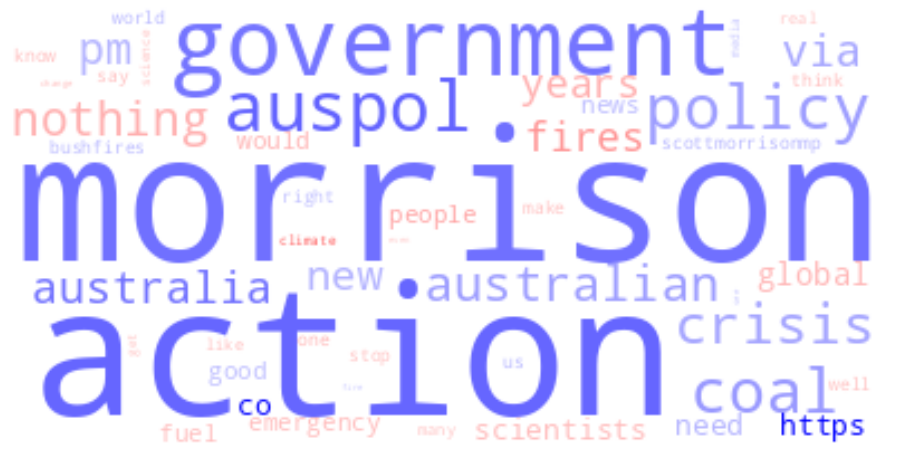

In [17]:
df = df[~df.index.isin(sw)]
df['summed'] = df['freq_corpus_0'] + df['freq_corpus_1']
df['polarity_div_summed'] = df['polarity'].abs() / df['summed']

top = 50
df_tmp = df.sort_values(by='summed', ascending=False).iloc[:top]

from juxtorpus.viz.polarity_wordcloud import PolarityWordCloud
pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='polarity_div_summed')
pwc.gradate('blue', 'red').render(16, 16)

## Word Cloud: TFIDF

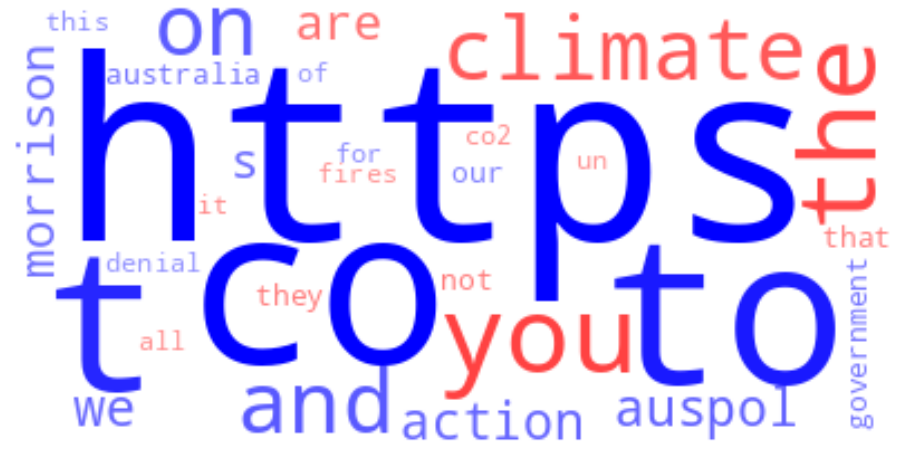

In [18]:
df = jux.polarity.tfidf()
df['size'] = df.polarity.abs()
df_tmp = df.sort_values(by='size', ascending=False).iloc[:30]
pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='size')
pwc.gradate('blue', 'red').render(16, 16)

## Word Cloud: Log Likelihood

The larger the size the more 'representative' it is of both corpus.

The colour gradient describes how 'polarised' it is.

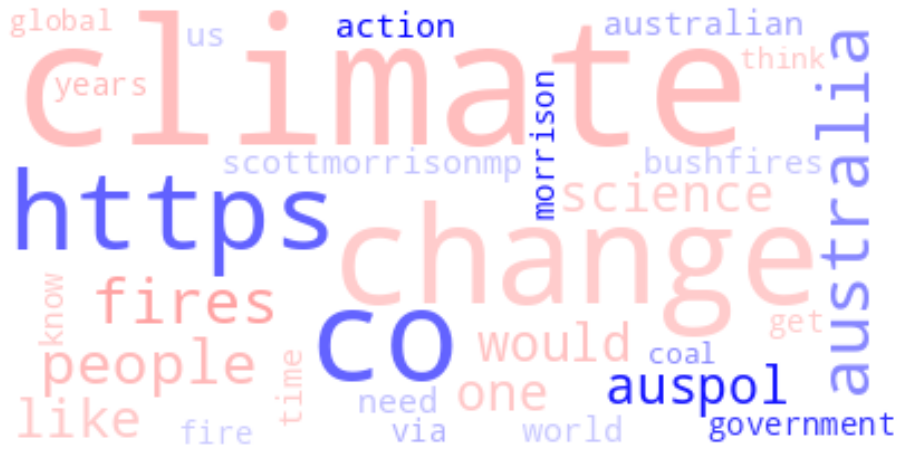

In [19]:
# Size = TF.abs()   Polarity = LLV

df = jux.polarity.log_likelihood()
tf_df = jux.polarity.tf()
df['size'] = tf_df['freq_corpus_0'] + tf_df['freq_corpus_1']
df = df[~df.index.isin(sw)]
df_tmp = df.sort_values(by='size', ascending=False).iloc[:30]
pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='size')
pwc.gradate('blue', 'red').render(16, 16)

In [20]:
df_tmp

,log_likelihood_llv,bayes_factor_bic,effect_size_ell,polarity,size,polarity_normalised_
climate,86.384515,71.130673,2.134588e-06,-86.384515,0.056821,1.462561
change,2.942457,-12.311385,7.756484e-08,-2.942457,0.030446,1.498725
co,594.576571,579.322729,1.579706e-05,594.576571,0.025136,1.757691
https,599.566751,584.312909,1.593899e-05,599.566751,0.024985,1.759854
australia,394.629506,379.375664,1.212846e-05,394.629506,0.007076,1.671034
fires,226.586983,211.333141,7.507515e-06,-226.586983,0.005641,1.401797
people,102.809221,87.555379,3.403429e-06,-102.809221,0.005389,1.455442
like,14.833505,-0.420337,5.062028e-07,-14.833505,0.004083,1.493571
science,4.998518,-10.255324,1.722081e-07,-4.998518,0.003752,1.497834
auspol,1021.991279,1006.737437,3.339958e-05,1021.991279,0.003741,1.942934


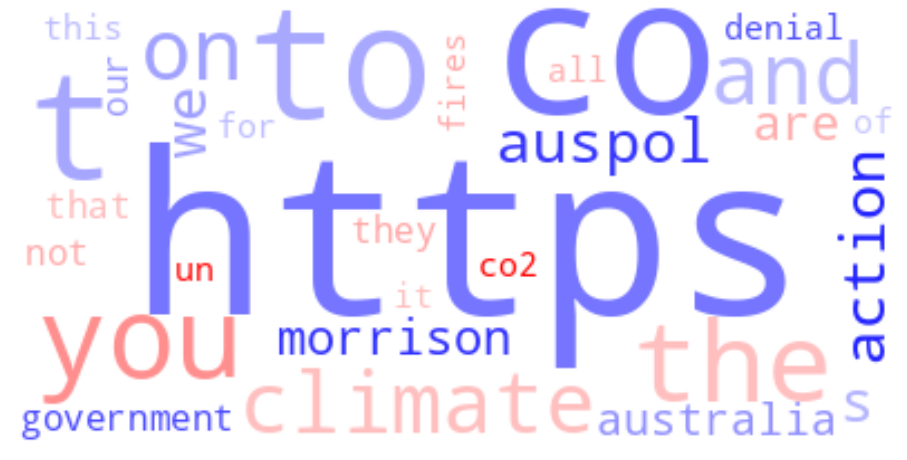

In [21]:
# Size = TFIDF.abs()   Polarity = LLV
df = jux.polarity.log_likelihood()
tfidf_df = jux.polarity.tfidf()
df['size'] = tfidf_df.polarity.abs()
df_tmp = df.sort_values(by='size', ascending=False).iloc[:30]
pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='size')
pwc.gradate('blue', 'red').render(16, 16)

In [22]:
# Size = baseline extracted keywords, Polarity = LLV

import pandas as pd
from juxtorpus.corpus.freqtable import FreqTable


freqtbl_baseline = FreqTable(list(), list())
freqtbl_baseline._series = pd.read_csv('./assets/baselines/auspol_freqtable.csv', index_col=0).dropna().squeeze().rename('freq')
# issue duplicate index can't be concatenated. Hence dropped here.
freqtbl_baseline._series.drop(freqtbl_baseline._series.loc[freqtbl_baseline.series.index.duplicated()].index, inplace=True)

In [23]:
from juxtorpus.stats.loglikelihood_effectsize import log_likelihood_and_effect_size
llv_baseline = log_likelihood_and_effect_size([corpus.dtm.freq_table(), freqtbl_baseline])
llv_baseline.head(3)

,freq_corpus_0,freq_corpus_1,expected_likelihoods,expected_freq_corpus_0,log_likelihood_ratio_corpus_0,log_likelihood_corpus_0,expected_freq_corpus_1,log_likelihood_ratio_corpus_1,log_likelihood_corpus_1,log_likelihood_llv,bayes_factor_bic,effect_size_ell
0,1778.0,19863.0,0.000122,2787.381205,-0.449613,-1598.825186,18853.618795,0.052154,2071.863076,473.037890,454.044665,3.363670e-07
00,147.0,1501.0,0.000009,212.263954,-0.367398,-108.015006,1435.736046,0.044454,133.450640,25.435634,6.442409,2.677939e-08
000,4591.0,46421.0,0.000288,6570.393699,-0.358476,-3291.525615,44441.606301,0.043576,4045.667539,754.141924,735.148699,4.839440e-07


In [24]:
llvb = llv_baseline
relative = llvb['freq_corpus_0'] - llvb['freq_corpus_1']
llvb['log_likelihood_llv_signed'] = (relative*llvb.log_likelihood_llv) / relative.abs()
llvb.log_likelihood_llv_signed.head(3)

0     -473.037890
00     -25.435634
000   -754.141924
Name: log_likelihood_llv_signed, dtype: float64

In [25]:
# use the llv_baseline to find the keywords
hard_threshold = 3.4

f"Before removal: {len(llvb)}, After: {len(llvb[llvb.log_likelihood_llv_signed > hard_threshold])}"

'Before removal: 1638929, After: 16929'

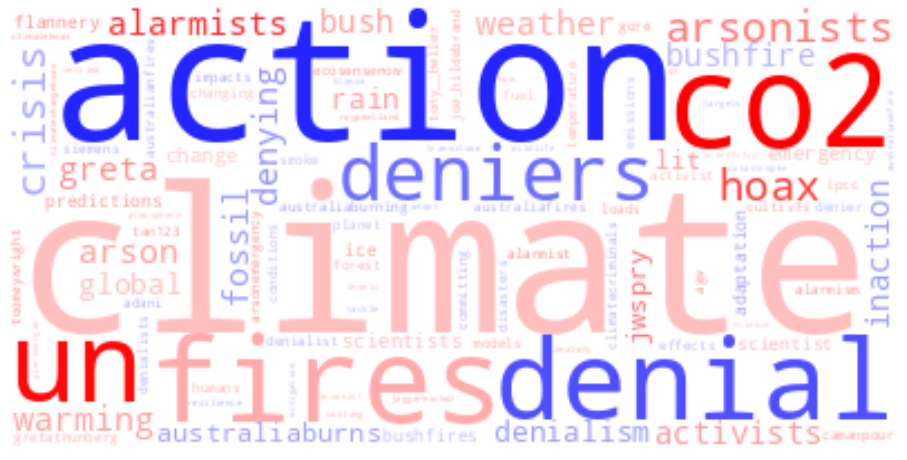

In [26]:
df = jux.polarity.log_likelihood()
# preprocessing - remove non keywords
df['llvb_signed'] = llvb.log_likelihood_llv_signed
df = df[df['llvb_signed'] > hard_threshold]

tfidf_df = jux.polarity.tfidf()
df['size'] = tfidf_df.polarity.abs()
df_tmp = df.sort_values(by='size', ascending=False).iloc[:100]
pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='size')
pwc.gradate('blue', 'red').render(16, 16)

In [27]:
jux.polarity.tfidf()

,freq_corpus_0,freq_corpus_1,polarity
0,4.216862e-05,0.000199,-1.567383e-04
00,3.808779e-06,0.000002,1.949835e-06
000,1.803729e-04,0.000225,-4.455927e-05
0000000000001,2.720556e-07,0.000000,2.720556e-07
00001,2.720556e-07,0.000000,2.720556e-07
...,...,...,...
ट,0.000000e+00,0.000002,-1.858943e-06
तन,0.000000e+00,0.000002,-1.858943e-06
य,0.000000e+00,0.000002,-1.858943e-06
ह,0.000000e+00,0.000002,-1.858943e-06


## Wordcloud: # only

In [28]:
import spacy
from juxtorpus.corpus.processors import process

nlp = spacy.blank('en')

s_corpus = process(corpus, nlp=nlp)
s_corpus.summary()

[INFO] Processing corpus of 831078 documents...
[INFO] Done.


Corpus Type           SpacyCorpus
No. Documents              831078
No. Terms                19834101
Vocabulary size            114212
No. Terms mean          23.865511
No. Terms std            13.51187
No. Terms min                 0.0
No. Terms 25%                12.0
No. Terms 50%                22.0
No. Terms 75%                36.0
No. Terms max                62.0
metas              quintile, date
dtype: object

In [29]:
s = s_corpus.slicer.filter_by_datetime('date', start='2020-01-01', end='2020-02-01')

In [30]:
list(s.slicer.group_by('quintile'))

[(0, <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccde8fa0>),
 (4, <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccdd94f0>)]

In [31]:
list(s_corpus.slicer.group_by('quintile'))

[(0, <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccdd9b20>),
 (4, <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccde7970>)]

In [32]:
# this is a new corpus after being processed by spacy, so we need to slice and create jux again.
groups = list(s_corpus.slicer.filter_by_datetime('date', start='2020-01-01', end='2020-02-01').slicer.group_by('quintile'))
q0, q4 = groups[0][1], groups[1][1]
jux = Jux(q0, q4)

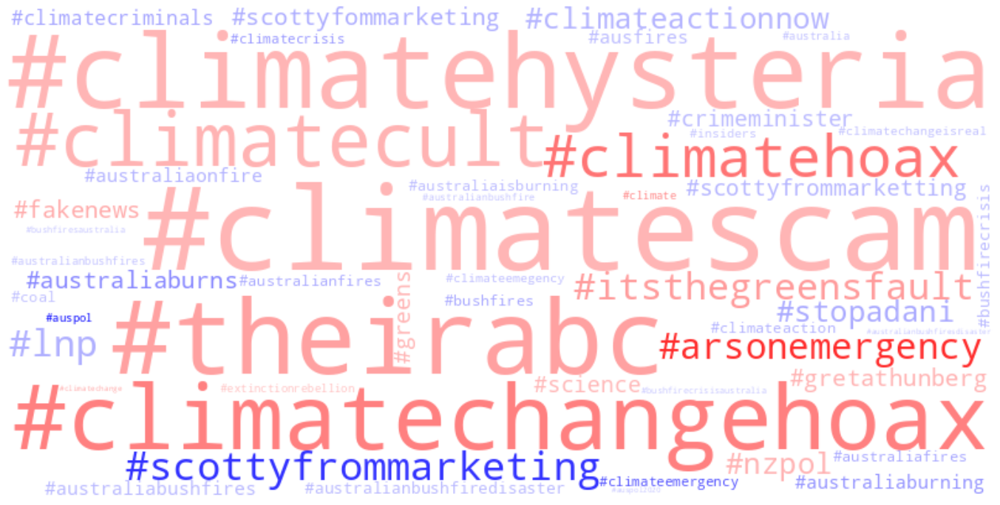

In [33]:
from juxtorpus.matchers import hashtags, at_mentions

matcher = hashtags(nlp.vocab)
# matcher = at_mentions(nlp.vocab)
def gen_hashtags_from(doc):
    return (doc[s:e].text.lower() for _, s, e in matcher(doc))
    

df = jux.polarity.tf(tokeniser_func=gen_hashtags_from)

df['summed'] = df['freq_corpus_0'] + df['freq_corpus_1']
df['polarity_div_summed'] = df['polarity'].abs() / df['summed']

top = 50
df_tmp = df.sort_values(by='summed', ascending=False).iloc[:top]

pwc = PolarityWordCloud(df_tmp, col_polarity='polarity', col_size='polarity_div_summed')
pwc.gradate('blue', 'red').render(24, 24)

In [34]:
corpus = jux.corpus_1
groups = list(corpus.slicer.group_by('date', grouper=pd.Grouper(freq='1d')))
groups[:3], len(groups)

([(Timestamp('2020-01-02 00:00:00', freq='D'),
   <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccdf2970>),
  (Timestamp('2020-01-03 00:00:00', freq='D'),
   <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccde7b80>),
  (Timestamp('2020-01-04 00:00:00', freq='D'),
   <juxtorpus.corpus.corpus.SpacyCorpus at 0x2ccdfe8b0>)],
 31)

In [35]:
corpus.create_custom_dtm(tokeniser_func=gen_hashtags_from)

<DTM 19448 docs X 1162 terms>

In [36]:
# create custom hashtag dtm for each corpus
dtms = [c.create_custom_dtm(tokeniser_func=gen_hashtags_from) for _, c in groups]

In [37]:
dtms[0].freq_table().series.sort_values(ascending=False)

#auspol                14
#climatechange          9
#climateemergency       4
#climate                3
#australianfires        3
                       ..
#exitparisagreement     1
#gippsland              1
#globalwarming          1
#gofuckyourself         1
#victoriafires          1
Name: freq, Length: 63, dtype: int64

In [38]:
from juxtorpus.viz.item_timeline import ItemTimeline

datetimes, freqtables = [dt for dt, _ in groups], [dtm.freq_table() for dtm in dtms]
#timeline = ItemTimeline.from_freqtables(datetimes, freqtables)

In [39]:
pd.Series(datetimes).unique()

array(['2020-01-02T00:00:00.000000000', '2020-01-03T00:00:00.000000000',
       '2020-01-04T00:00:00.000000000', '2020-01-05T00:00:00.000000000',
       '2020-01-06T00:00:00.000000000', '2020-01-07T00:00:00.000000000',
       '2020-01-08T00:00:00.000000000', '2020-01-09T00:00:00.000000000',
       '2020-01-10T00:00:00.000000000', '2020-01-11T00:00:00.000000000',
       '2020-01-12T00:00:00.000000000', '2020-01-13T00:00:00.000000000',
       '2020-01-14T00:00:00.000000000', '2020-01-15T00:00:00.000000000',
       '2020-01-16T00:00:00.000000000', '2020-01-17T00:00:00.000000000',
       '2020-01-18T00:00:00.000000000', '2020-01-19T00:00:00.000000000',
       '2020-01-20T00:00:00.000000000', '2020-01-21T00:00:00.000000000',
       '2020-01-22T00:00:00.000000000', '2020-01-23T00:00:00.000000000',
       '2020-01-24T00:00:00.000000000', '2020-01-25T00:00:00.000000000',
       '2020-01-26T00:00:00.000000000', '2020-01-27T00:00:00.000000000',
       '2020-01-28T00:00:00.000000000', '2020-01-29

In [40]:
fts_df = pd.concat([ft.series for ft in freqtables], axis=1).fillna(0).T
fts_df.reset_index(drop=True)
fts_df = fts_df.set_index(pd.Series(datetimes))

In [41]:
timeline = ItemTimeline(fts_df)

In [42]:
timeline.top, timeline.mode

(3, 'PEAK')

In [43]:
timeline.render()

In [48]:
timeline._get_opacity(timeline.items[-1])

1.0

In [50]:
timeline._metric_series.index.get_loc(timeline.items[0])

5

In [37]:
import random
from collections import namedtuple
import plotly.graph_objects as go

random.seed(42**2)

fig = go.Figure()
hashtags = sorted(list({ht for dtm in dtms for ht in dtm.term_names}))

def get_count(dtm, hashtag:str):
    ft = dtm.freq_table()
    try:
        return ft.series.loc[ht]/dtm.total   # over number of hashtags
    except:
        return 0
    
TRACE_CONTENT = namedtuple('TRACE_CONTENT', ['hashtag', 'x', 'y'])
trace_contents = []
for ht in hashtags:
    # get all the unique hashtags (x = date, y = num hashtag)
    x = [ts for ts, _ in groups]
    y = [get_count(dtm, ht) for dtm in dtms]
    trace_contents.append(TRACE_CONTENT(hashtag=ht, x=x, y=y))

# trace_contents_count_series = pd.Series((sum(tc.y) for tc in trace_contents), dtype='float')
trace_contents_count_series = pd.Series((max(tc.y) for tc in trace_contents), dtype='float')

df_counts = zip(
    (sum(tc.y) for tc in trace_contents),
    (max(tc.y) for tc in trace_contents)
)
df_columns = ['sum', 'max']
trace_contents_df = pd.DataFrame(df_counts, columns=df_columns)

import colorsys
def get_colour(trace_content: TRACE_CONTENT, mode: str, top: int =3) -> str:
    tc = trace_content
    trace_contents_count_series = trace_contents_df[mode]
    top_quantile = 1 - (top/trace_contents_count_series.count())
    
    # colours
    ri = random.randint
    h = hash(tc.hashtag)
    r, g, b = (h * ri(0, 10)) % 256, (h * ri(0, 10)) % 256, (h * ri(0, 10)) % 256 # max rgb value = 255
    
    
    
    if mode.upper() == 'sum':
        metric = sum(tc.y)
    else:
        metric = max(tc.y)
    if metric > trace_contents_count_series.quantile(top_quantile):
        opacity = 1.0
        h, l, s = ri(0, 100)/100, 0.5, 1.0
        r, g, b = tuple(code*255 for code in colorsys.hls_to_rgb(h, l, s))
    elif metric > trace_contents_count_series.quantile(0.95):
        opacity = 0.2
    else:
        opacity = 0.05
    

    return f'rgba({r},{g},{b},{opacity})'
    
for tc in trace_contents:
    fig.add_trace(
        go.Scatter(
            x=tc.x, y=tc.y, mode='lines+markers', name=tc.hashtag,
            marker_color=get_colour(tc, 'max', top=2)
        )
    )
fig.show()

In [38]:
get_colour(trace_contents[2], 'max', top=3)

'rgba(224,8,40,0.05)'

In [39]:
trace_contents_count_series.count()

1162

In [40]:
15.2 %256

15.2

In [41]:
pd.Series([1,2 ,3]).quantile(0.75)

2.5

In [140]:
import colorsys
tuple(code*255 for code in colorsys.hls_to_rgb(0.0, 0.5, 1.0))

(255.0, 0.0, 0.0)

In [135]:
colorsys.rgb_to_hls(255/255, 0/255, 0/255)

(0.0, 0.5, 1.0)

In [114]:
ht_dtm = q0.create_custom_dtm(gen_hashtags_from)
ht_dtm

[INFO] Building document-term matrix. Please wait...
[INFO] Done.


<DTM 134284 docs X 6747 terms>

In [115]:
ht_dtm.term_names

array(['#  ', '# #', '# <', ..., '#zombie', '#zuckerberg', '#zug'],
      dtype=object)

In [116]:
def tristram():
    return x # <- equation 

def tristram2():
    return y

df = jux.polarity.user_defined(tristram2)

,freq_corpus_0,freq_corpus_1,polarity
a,1.831469e-02,0.018369,-5.447820e-05
aa,1.237751e-06,0.000000,1.237751e-06
aaa,2.784940e-06,0.000000,2.784940e-06
aaaaaaand,3.094377e-07,0.000000,3.094377e-07
aaaaaaargh,3.094377e-07,0.000000,3.094377e-07
...,...,...,...
zraika,0.000000e+00,0.000004,-4.261494e-06
zud,0.000000e+00,0.000002,-2.130747e-06
zzzzz,0.000000e+00,0.000002,-2.130747e-06
zzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzz,0.000000e+00,0.000002,-2.130747e-06
